# Importing necessary libraries

In [1]:
!pip install folium
!pip install webbrowser
!pip install geopy

ERROR: Could not find a version that satisfies the requirement webbrowser (from versions: none)
ERROR: No matching distribution found for webbrowser


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go

from geopy.exc import GeocoderTimedOut
from geopy.geocoders import Photon

from collections import Counter


#for word chart
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS

In [3]:
pd.set_option('display.max_columns', None)

# Reading restaurant datasets

In [4]:
import glob
import os

current_path = os.getcwd()
notebooks_directory_path = os.path.abspath(os.path.join(current_path, ".."))
parent_directory_path = os.path.abspath(os.path.join(notebooks_directory_path, ".."))
data_folder_path = os.path.join(parent_directory_path, "data")
restaurant_data_folder_path = os.path.join(data_folder_path, "restaurant")

In [5]:
restaurant_data_folder_path

'C:\\Users\\keyur\\OneDrive\\Desktop\\LAMBTON\\LAMBTON SECOND SEMESTER\\TERM PROJECT\\data\\restaurant'

In [6]:
df = pd.read_csv(restaurant_data_folder_path + '/' + 'restaurants.csv')

In [7]:
df_menu = pd.read_csv(restaurant_data_folder_path + '/' + 'restaurant-menus.csv')

In [8]:
df.head()

,id,position,name,score,ratings,category,price_range,full_address,zip_code,lat,lng
0,1,19,PJ Fresh (224 Daniel Payne Drive),NaN,NaN,"Burgers, American, Sandwiches",$,"224 Daniel Payne Drive, Birmingham, AL, 35207",35207,33.562365,-86.830703
1,2,9,J' ti`'z Smoothie-N-Coffee Bar,NaN,NaN,"Coffee and Tea, Breakfast and Brunch, Bubble Tea",NaN,"1521 Pinson Valley Parkway, Birmingham, AL, 35217",35217,33.583640,-86.773330
2,3,6,Philly Fresh Cheesesteaks (541-B Graymont Ave),NaN,NaN,"American, Cheesesteak, Sandwiches, Alcohol",$,"541-B Graymont Ave, Birmingham, AL, 35204",35204,33.509800,-86.854640
3,4,17,Papa Murphy's (1580 Montgomery Highway),NaN,NaN,Pizza,$,"1580 Montgomery Highway, Hoover, AL, 35226",35226,33.404439,-86.806614
4,5,162,Nelson Brothers Cafe (17th St N),4.7,22.0,"Breakfast and Brunch, Burgers, Sandwiches",NaN,"314 17th St N, Birmingham, AL, 35203",35203,33.514730,-86.811700


In [9]:
df.shape

(40227, 11)

In [10]:
df_menu.head()

,restaurant_id,category,name,description,price
0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD
1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD
2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD
3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD
4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD


# Merging Datasets

##### Merging both restaurant data and restaurants review data using id and restaurant_id

In [11]:
# merged_df = pd.merge(df, df_menu, left_on='id', right_on='restaurant_id')

In [12]:
# merged_df.head(2)

In [13]:
# merged_df.to_csv('merged_restaurant.csv')

In [14]:
# merged_df.rename(columns={'name_x':'restaurant_name','name_y':'dish_name'},inplace=True)

In [15]:
df.shape

(40227, 11)

In [16]:
df.isna().sum()

id                  0
position            0
name                0
score           17973
ratings         17973
category           23
price_range      6646
full_address      278
zip_code          287
lat                 0
lng                 0
dtype: int64

In [17]:
df.dropna(inplace=True)

In [18]:
df.shape

(19118, 11)

In [19]:
df.head(5)

,id,position,name,score,ratings,category,price_range,full_address,zip_code,lat,lng
6,7,27,Jinsei Sushi,4.7,63.0,"Sushi, Asian, Japanese",$,"1830 29th Ave S, Birmingham, AL, 35209",35209,33.480440,-86.790440
13,14,51,Panera (521 Fieldstown Road),4.6,44.0,"Breakfast and Brunch, salad, Sandwich, Family ...",$,"521 Fieldstown Road, Gardendale, AL, 35071",35071,33.651407,-86.819247
15,16,88,Jeni's Splendid Ice Cream (Pepper Place),5.0,20.0,"Ice Cream &amp; Frozen Yogurt, Comfort Food, D...",$$$,"219 29th St S, Birmingham, AL, 35233",35233,33.516600,-86.789950
18,19,30,Falafel Cafe,4.9,48.0,"Middle Eastern, Mediterranean, Vegetarian, Gre...",$,"401 19th St S, Birmingham, AL, 35233",35233,33.508353,-86.803170
19,20,40,MrBeast Burger (838 Odum Road),3.7,19.0,"American, Burgers, Sandwich",$$,"838 Odum Road, Gardendale, AL, 35071",35071,33.645480,-86.826260


In [20]:
df.isna().sum()

id              0
position        0
name            0
score           0
ratings         0
category        0
price_range     0
full_address    0
zip_code        0
lat             0
lng             0
dtype: int64

In [21]:
for i in df.columns:
    print(i,'---------------->',df[i].nunique())

id ----------------> 19118
position ----------------> 300
name ----------------> 18803
score ----------------> 30
ratings ----------------> 409
category ----------------> 5576
price_range ----------------> 4
full_address ----------------> 17835
zip_code ----------------> 1373
lat ----------------> 18595
lng ----------------> 18586


# EDA and Data Cleaning

### Area plot for restaurant's position

##### Insight: it can be observed that majority of resturants are having position ranked from 1-50 and that's why the distribution is right scewed

In [22]:
# Counting occurrences of each category
count_data = df['position'].value_counts().reset_index()

fig = px.area(count_data, x="index", y="position")
fig.show()

### Converting score attribute into segment so can get better visualization and insights

In [23]:
score_segment = []
for i in df['score']:
    if i >= 0 and i <= 1:
        score_segment.append('<1')
    elif i > 1 and i <= 2:
        score_segment.append('<2')
    elif i > 2 and i <= 3:
        score_segment.append('<3')
    elif i > 3 and i <= 4:
        score_segment.append('<4')
    elif i > 4 and i <= 4.5:
        score_segment.append('<4.5')
    else: 
        score_segment.append('>4.5')

df['score_segment'] = score_segment

### Donut chart of score_segment
##### Majority of restaurant's are having ratings more 4 stars which will be very useful while suggesting these restaurants to out tourists

In [24]:
labels = df.score_segment.value_counts().index
values = df.score_segment.value_counts().values

colors = ['#00BFFF', '#87CEEB','#ADD8E6', '#87CEFA','#5DADE2','#3498DB','#1E90FF','#157DEC','#0B5EA6','#044D85','#023662','#012C49']

# Creating the donut chart
fig = go.Figure(data=[go.Pie(
    labels=labels,
    values=values,
    marker=dict(colors=colors),  # Set the light blue colors here
    hole=0.6,  # Specify the inner radius (0 to 1, where 0 is a pie chart and 1 is a full donut chart)
)])

# Adding title
fig.update_layout(
    title='Donut Chart'
)

# Displaying the plot
fig.show()


### Area chart of position according to ratings

##### So as you can see restaurants at position 1 are having more than 4.5 ratings and as position number increases other scores except >4.5 starts decreasing

In [25]:
pos_score_agg = df.groupby(['position', 'score_segment']).agg('sum').reset_index()
pos_score_agg

fig = px.area(pos_score_agg, x="position", y="ratings", color='score_segment')

# Adding title
fig.update_layout(
    title='Area plot of position according to ratings and score_segment'
)

fig.show()

### Converting string values into numeric values

In [26]:
df['price_range'] = df['price_range'].apply(lambda x: 1 if x == '$' else (2 if x == '$$' else (3 if x == '$$$' else 4)))

### Pie chart of price_range to see the proportion

##### insight: 76.1% restaurants are having price_range which is pocket friendly which only less than 1% restaurants are much expensive which would be hard to afford but we can recommend it to the tourist who likes lavish food.

In [27]:
# Counting occurrences of each category
count_data = df['price_range'].value_counts()

labels = count_data.index
values = count_data.values

# Creating the pie chart with bold values
fig = go.Figure(data=[go.Pie(
    labels=labels,
    values=values,
    marker=dict(colors=colors),  # Set the light blue colors here
    texttemplate='<b>%{value}</b> (%{percent})',  # Make only the values bold using Plotly's formatting syntax
    hovertemplate='%{label}: <b>%{value}</b> (%{percent})',  # Custom hover template
)])

# Adding title
fig.update_layout(
    title='Price Range'
)

# Displaying the plot
fig.show()

### Box plot to detect outliers for ratings 
###### by getting idea of outliers we won't be deleting any single record because outliers will be having the highest number of ratings and those are the restaurants which should be suggested to the customer.

In [28]:
# Creating the box plot
fig = go.Figure()
fig.add_trace(go.Box(x=df.ratings,orientation='h'))

# Adding title and axis labels
fig.update_layout(
    title="Box Plot",
    yaxis_title="Value"
    
)

max_height = 300

# Updating the layout with smaller dimensions
fig.update_layout(
    height=max_height,
    autosize=False,  # Set autosize to False
    margin=dict(l=0, r=0, b=0, t=0, pad=0),  # Add margin to accommodate the plot within the specified dimensions
    
)

### Converting ratings attribute into segment so can get better visualization and insights

In [29]:
ratings_segment = []
for i in df['ratings']:
    if i >= 0 and i <= 100:
        ratings_segment.append('0-100')
    elif i > 100 and i <= 200:
        ratings_segment.append('101-200')
    elif i > 200 and i <= 300:
        ratings_segment.append('201-300')
    elif i > 300 and i <= 400:
        ratings_segment.append('301-400')
    elif i > 400 and i <= 500:
        ratings_segment.append('401-500')
    else: 
        ratings_segment.append('>500')

df['ratings_segment'] = ratings_segment

In [30]:
labels = df.ratings_segment.value_counts().index
values = df.ratings_segment.value_counts().values

# Create the bar plot
fig = go.Figure(data=go.Bar(x=labels, y=values, marker=dict(color='#2176ae')))

# Customize the layout
fig.update_layout(
    title='Rating Segment',
    xaxis_title='Categories',
    yaxis_title='Values'
)

# Display the plot
fig.show()

### Converting position attribute into segment so can get better visualization and insights

In [31]:
position_segment = []
for i in df['position']:
    if i >= 0 and i <= 50:
        position_segment.append('0-50')
    elif i > 50 and i <= 100:
        position_segment.append('50-100')
    elif i > 100 and i <= 150:
        position_segment.append('100-150')
    elif i > 150 and i <= 200:
        position_segment.append('150-200')
    elif i > 200 and i <= 250:
        position_segment.append('200-250')
    else: 
        position_segment.append('250-300')

df['position_segment'] = position_segment

##### Insight: it is clear that the overall proportion of all the segment of position remains the same for segment 1-100 and 101-200 but the total number of records get decreased.

In [32]:
fig = px.histogram(df, x="ratings_segment", color="position_segment", barmode="group")
fig.show()

##### Insight: it is clear that the majority of all restaurants across ratings_segment are more affordable.

In [33]:
fig = px.histogram(df, x="ratings_segment", color="price_range", barmode='group')
fig.show()

### Scatter plot of ratings across positions of restaurants with score

##### There are some outliers which can be detected which are having having very less ratings which is less than 50 but still they are having good position at less than 25 so these restaurants might be giving some good services and food to customer which are making them more popular .

In [34]:
# plt.scatter(df.ratings, df.score, c=df.position)

# Create a scatter plot
fig = go.Figure(data=go.Scatter(
    x=df.ratings,
    y=df.position,
    mode='markers',
    marker=dict(
        color=df.score,
        colorscale='Viridis',  # Set the colorscale
        colorbar=dict(title='score'),  # Add a colorbar
    )
))

# Customize the plot layout
fig.update_layout(
    title='Scatter Plot with Color',
    xaxis=dict(title='Ratings'),
    yaxis=dict(title='Position'),
)

# Display the plot
fig.show()



### Distribution of Score with price_range

##### it can be seen that throughout the distribution there is 74.5 * 25 * 0.3 * 0.2 ratio is there.

In [35]:
# Group the data by 'score' and 'price_range', and calculate the count
grouped_data = df.groupby(['score', 'price_range']).size().reset_index(name='Count')

# Create a stacked bar plot
fig = go.Figure(data=[
    go.Bar(name='Price 1', x=grouped_data[grouped_data['price_range'] == 1]['score'], y=grouped_data[grouped_data['price_range'] == 1]['Count']),
    go.Bar(name='Price 2', x=grouped_data[grouped_data['price_range'] == 2]['score'], y=grouped_data[grouped_data['price_range'] == 2]['Count']),
    go.Bar(name='Price 3', x=grouped_data[grouped_data['price_range'] == 3]['score'], y=grouped_data[grouped_data['price_range'] == 3]['Count']),
    go.Bar(name='Price 4', x=grouped_data[grouped_data['price_range'] == 4]['score'], y=grouped_data[grouped_data['price_range'] == 4]['Count'])
])

# Customize the plot layout
fig.update_layout(
    title='Stacked Count Plot of Score (Stacked by Price Range)',
    xaxis=dict(title='Score'),
    yaxis=dict(title='Count'),
    barmode='stack'  # Set the barmode to 'stack' for stacking
)

# Display the plot
fig.show()


### Scatter plot of ratings across positions of restaurants with price_range

##### Insight: this graph gives the visualization as the above one but by this you can get better idea the proportion of data which are getting affected.

In [36]:
# Create a scatter plot
fig = go.Figure(data=go.Scatter(
    x=df.ratings,
    y=df.position,
    mode='markers',
    marker=dict(
        color=df.price_range,
        colorscale='Viridis',  # Set the colorscale
        colorbar=dict(title='score'),  # Add a colorbar
    )
))

# Customize the plot layout
fig.update_layout(
    title='Scatter Plot with Color',
    xaxis=dict(title='Ratings'),
    yaxis=dict(title='Position'),
)

# Display the plot
fig.show()

### Proportion of restaurants across USA

In [37]:
import folium
import webbrowser
from folium import plugins

m = folium.Map(height=500,location=[37.09024,-95.712891], zoom_start=4)

# convert to (n, 2) nd-array format for heatmap
stationArr = df[['lat','lng']]

# plot heatmap
m.add_child(plugins.HeatMap(stationArr, radius=15))
m

### Most expensive restauratns across USA

In [38]:
import folium
import webbrowser
from folium import plugins

m = folium.Map(height=500,location=[37.09024,-95.712891], zoom_start=4)

# convert to (n, 2) nd-array format for heatmap
stationArr = df[df['price_range'] == 4][['lat','lng']] 

# plot heatmap
m.add_child(plugins.HeatMap(stationArr, radius=15))
m

### Top restauratns across USA

In [39]:
import folium
import webbrowser
from folium import plugins

m = folium.Map(height=500,location=[37.09024,-95.712891], zoom_start=4)

# convert to (n, 2) nd-array format for heatmap
stationArr = df[df['position'] == 1][['lat','lng']] 

# plot heatmap
m.add_child(plugins.HeatMap(stationArr, radius=15))
m

# Restaurant Categories WordCloud 

##### chunked every large categories into single word to better visulize it

In [40]:
categories = df['category'].value_counts().index
categories_chunked = []
categories_chunked = [word.strip() for item in categories for word in item.split(',')]
unique_values = list(set(categories_chunked))

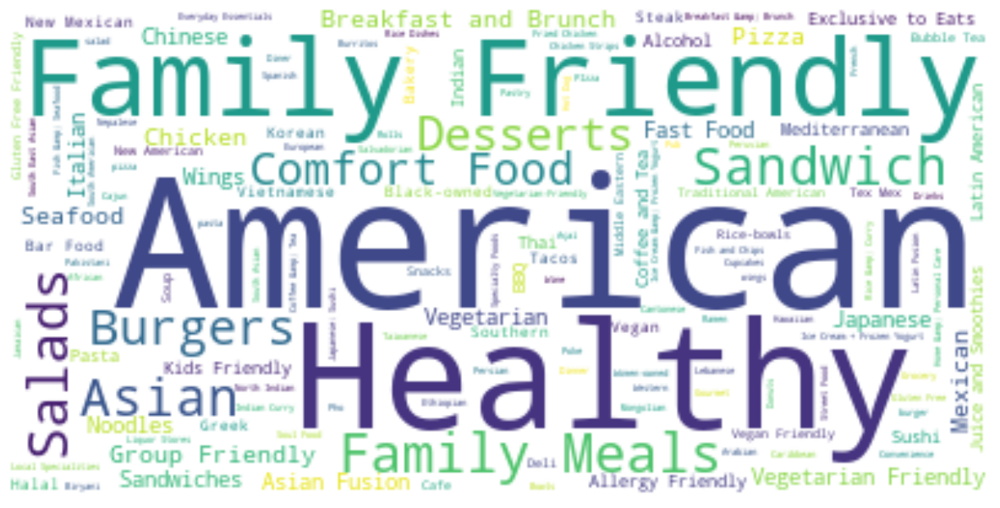

In [41]:
result_dict = {}
for items_y in unique_values:
    count = 0
    for items_x in categories_chunked:
        if items_y == items_x:
            count += 1
    result_dict[items_y] = count  # Add key-value pair to the dictionary
#     print(f"Count of {items_y} is {count}")

text = result_dict
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords,background_color="white").generate_from_frequencies(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Dataset for Restaurent Menu

In [42]:
df_menu

,restaurant_id,category,name,description,price
0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD
1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD
2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD
3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD
4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD
...,...,...,...,...,...
3375206,40227,Kid’s Mains,Lion Plate,BBQ skewer two pices and fantail shrimp two pi...,8.55 USD
3375207,40227,Beverages,Soft Drinks,NaN,1.95 USD
3375208,40227,Beverages,Iced Tea,NaN,1.95 USD
3375209,40227,Desserts,Sesame Balls (4 pcs),NaN,3.95 USD


# WordCloud Different food categories

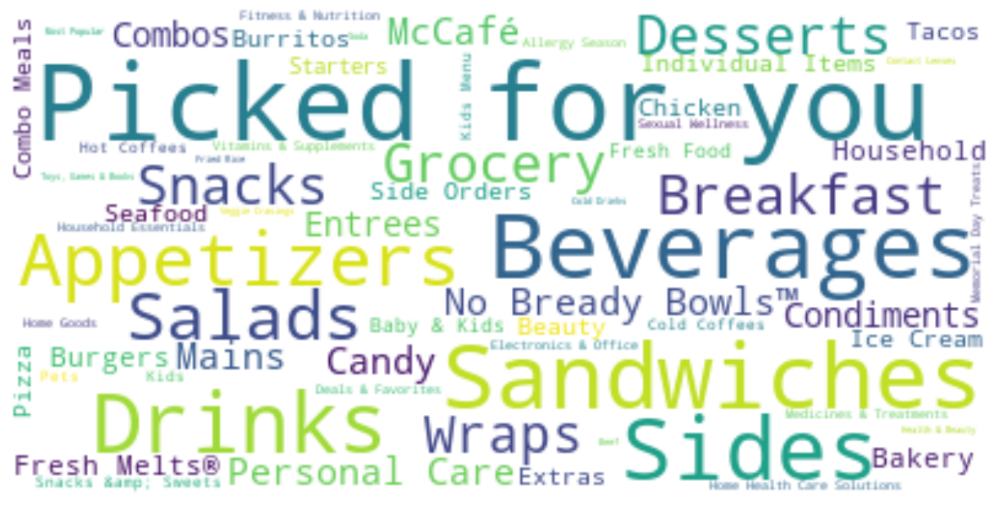

In [43]:
text = df_menu['category'].value_counts().to_dict()
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords,background_color="white").generate_from_frequencies(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Boxplot for Price range

##### Majority of the restaurant deals between 1-20 dollar price range however there are even many records restaurants which remains above that range

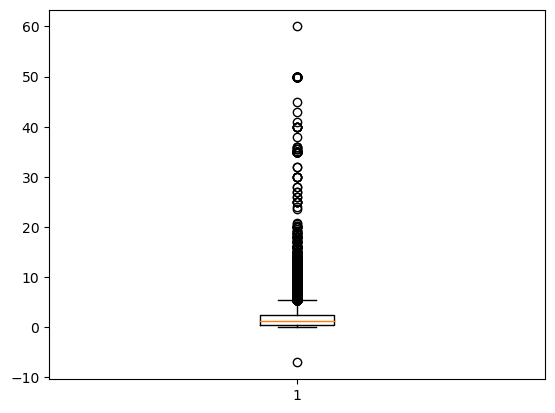

In [44]:
df_menu['price'] = df_menu['price'].str.replace(' USD', '')
df_menu['price'] = df_menu['price'].astype(float)

# Group by ID and get the minimum and maximum values for the USD column
df_merged = df_menu.groupby('restaurant_id').agg({'price': ['min', 'max']}).reset_index()

# Rename the columns for clarity
df_merged.columns = ['ID', 'Minimum USD', 'Maximum USD']

df_merged['range'] = df_merged['Minimum USD'].astype(str) + '-' + df_merged['Maximum USD'].astype(str)

df_merged[df_merged['Minimum USD'] < 0]

plt.boxplot(df_merged['Minimum USD'])
plt.show()

##### There are minimal restaurants which has starting range from 50$ 

<AxesSubplot:xlabel='ID', ylabel='Minimum USD'>

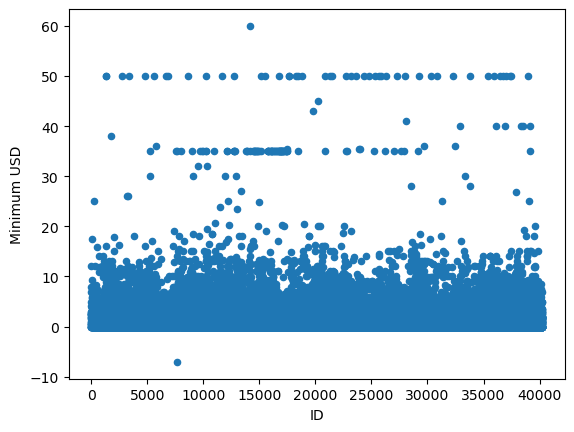

In [45]:
df_merged.plot.scatter(x='ID', y='Minimum USD')

##### There are very few restaurants which has some dishes which costs more than 1000$

<AxesSubplot:xlabel='ID', ylabel='Maximum USD'>

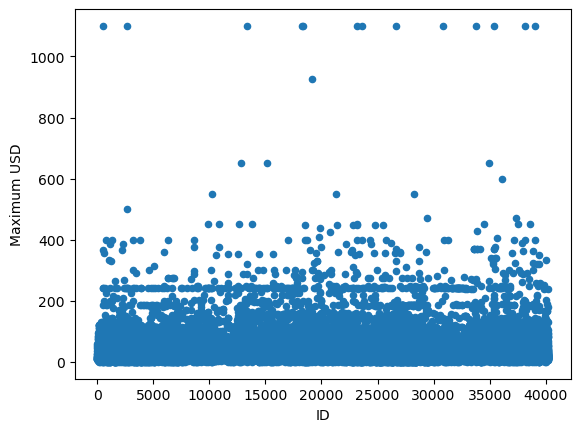

In [46]:
df_merged.plot.scatter(x='ID', y='Maximum USD')

### Removing restaurants which have maximum USD range of 0 dollar

In [47]:
rows_to_delete = df_merged[df_merged['Maximum USD'] == 0]['ID']
df_menu = df_menu[~df_menu['restaurant_id'].isin(rows_to_delete.values)]
df = df[~df['id'].isin(rows_to_delete.values)]

In [48]:
df.to_csv(restaurant_data_folder_path + '/' + 'df_to_grab_location_data.csv')

In [49]:
df_menu_notnull = df_menu.dropna()

# WordCloud for description field

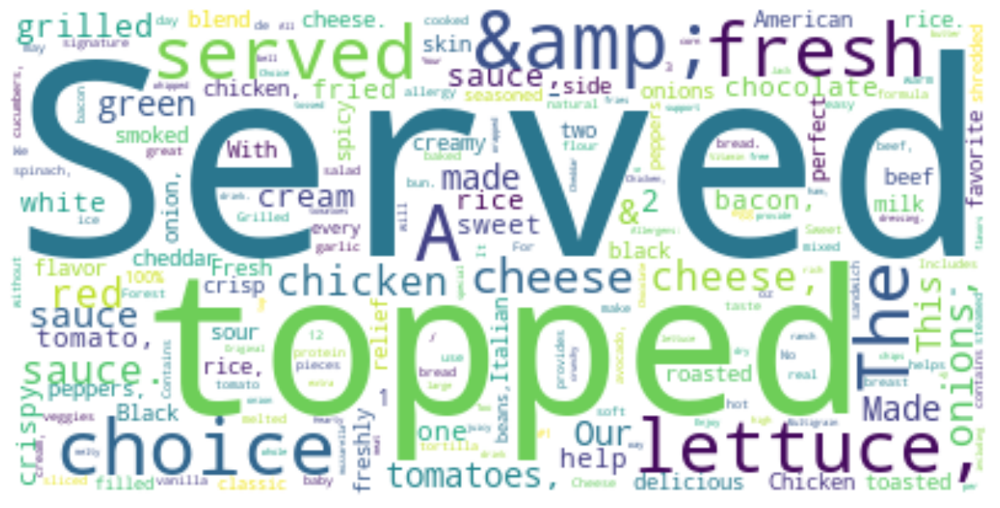

In [50]:
description_array = df_menu_notnull['description'].to_list()
description_array = [word for text in description_array for word in text.split(' ')]

# Assuming 'description_array' is your list of words
word_counts = Counter(description_array)
text = dict(word_counts)

stopwords = set(STOPWORDS)

for i in stopwords:
    if i not in text:
        pass
    else:
        text[i] = 0

wordcloud = WordCloud(stopwords=stopwords,background_color="white").generate_from_frequencies(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
df.to_csv(restaurant_data_folder_path + '/' + 'cleaned_restaurant_data.csv')
df_menu.to_csv(restaurant_data_folder_path + '/' + 'cleaned_restaurant_menu_data.csv')